In [1]:

# imports
import os
import sys
import types
import json
import base64

# figure size/format
fig_width = 8
fig_height = 5
fig_format = 'retina'
fig_dpi = 96
interactivity = ''
is_shiny = False
is_dashboard = False
plotly_connected = True

# matplotlib defaults / format
try:
  import matplotlib.pyplot as plt
  plt.rcParams['figure.figsize'] = (fig_width, fig_height)
  plt.rcParams['figure.dpi'] = fig_dpi
  plt.rcParams['savefig.dpi'] = "figure"
  from IPython.display import set_matplotlib_formats
  set_matplotlib_formats(fig_format)
except Exception:
  pass

# plotly use connected mode
try:
  import plotly.io as pio
  if plotly_connected:
    pio.renderers.default = "notebook_connected"
  else:
    pio.renderers.default = "notebook"
  for template in pio.templates.keys():
    pio.templates[template].layout.margin = dict(t=30,r=0,b=0,l=0)
except Exception:
  pass

# disable itables paging for dashboards
if is_dashboard:
  try:
    from itables import options
    options.dom = 'fiBrtlp'
    options.maxBytes = 1024 * 1024
    options.language = dict(info = "Showing _TOTAL_ entries")
    options.classes = "display nowrap compact"
    options.paging = False
    options.searching = True
    options.ordering = True
    options.info = True
    options.lengthChange = False
    options.autoWidth = False
    options.responsive = True
    options.keys = True
    options.buttons = []
  except Exception:
    pass
  
  try:
    import altair as alt
    # By default, dashboards will have container sized
    # vega visualizations which allows them to flow reasonably
    theme_sentinel = '_quarto-dashboard-internal'
    def make_theme(name):
        nonTheme = alt.themes._plugins[name]    
        def patch_theme(*args, **kwargs):
            existingTheme = nonTheme()
            if 'height' not in existingTheme:
              existingTheme['height'] = 'container'
            if 'width' not in existingTheme:
              existingTheme['width'] = 'container'

            if 'config' not in existingTheme:
              existingTheme['config'] = dict()
            
            # Configure the default font sizes
            title_font_size = 15
            header_font_size = 13
            axis_font_size = 12
            legend_font_size = 12
            mark_font_size = 12
            tooltip = False

            config = existingTheme['config']

            # The Axis
            if 'axis' not in config:
              config['axis'] = dict()
            axis = config['axis']
            if 'labelFontSize' not in axis:
              axis['labelFontSize'] = axis_font_size
            if 'titleFontSize' not in axis:
              axis['titleFontSize'] = axis_font_size  

            # The legend
            if 'legend' not in config:
              config['legend'] = dict()
            legend = config['legend']
            if 'labelFontSize' not in legend:
              legend['labelFontSize'] = legend_font_size
            if 'titleFontSize' not in legend:
              legend['titleFontSize'] = legend_font_size  

            # The header
            if 'header' not in config:
              config['header'] = dict()
            header = config['header']
            if 'labelFontSize' not in header:
              header['labelFontSize'] = header_font_size
            if 'titleFontSize' not in header:
              header['titleFontSize'] = header_font_size    

            # Title
            if 'title' not in config:
              config['title'] = dict()
            title = config['title']
            if 'fontSize' not in title:
              title['fontSize'] = title_font_size

            # Marks
            if 'mark' not in config:
              config['mark'] = dict()
            mark = config['mark']
            if 'fontSize' not in mark:
              mark['fontSize'] = mark_font_size

            # Mark tooltips
            if tooltip and 'tooltip' not in mark:
              mark['tooltip'] = dict(content="encoding")

            return existingTheme
            
        return patch_theme

    # We can only do this once per session
    if theme_sentinel not in alt.themes.names():
      for name in alt.themes.names():
        alt.themes.register(name, make_theme(name))
      
      # register a sentinel theme so we only do this once
      alt.themes.register(theme_sentinel, make_theme('default'))
      alt.themes.enable('default')

  except Exception:
    pass

# enable pandas latex repr when targeting pdfs
try:
  import pandas as pd
  if fig_format == 'pdf':
    pd.set_option('display.latex.repr', True)
except Exception:
  pass

# interactivity
if interactivity:
  from IPython.core.interactiveshell import InteractiveShell
  InteractiveShell.ast_node_interactivity = interactivity

# NOTE: the kernel_deps code is repeated in the cleanup.py file
# (we can't easily share this code b/c of the way it is run).
# If you edit this code also edit the same code in cleanup.py!

# output kernel dependencies
kernel_deps = dict()
for module in list(sys.modules.values()):
  # Some modules play games with sys.modules (e.g. email/__init__.py
  # in the standard library), and occasionally this can cause strange
  # failures in getattr.  Just ignore anything that's not an ordinary
  # module.
  if not isinstance(module, types.ModuleType):
    continue
  path = getattr(module, "__file__", None)
  if not path:
    continue
  if path.endswith(".pyc") or path.endswith(".pyo"):
    path = path[:-1]
  if not os.path.exists(path):
    continue
  kernel_deps[path] = os.stat(path).st_mtime
print(json.dumps(kernel_deps))

# set run_path if requested
run_path = 'L2hvbWUvc2ZvdWNoZXIvREVWL1RyYWl0ZW1lbnRJbWFnZXNQeXRob25Wb2wx'
if run_path:
  # hex-decode the path
  run_path = base64.b64decode(run_path.encode("utf-8")).decode("utf-8")
  os.chdir(run_path)

# reset state
%reset

# shiny
# Checking for shiny by using False directly because we're after the %reset. We don't want
# to set a variable that stays in global scope.
if False:
  try:
    import htmltools as _htmltools
    import ast as _ast

    _htmltools.html_dependency_render_mode = "json"

    # This decorator will be added to all function definitions
    def _display_if_has_repr_html(x):
      try:
        # IPython 7.14 preferred import
        from IPython.display import display, HTML
      except:
        from IPython.core.display import display, HTML

      if hasattr(x, '_repr_html_'):
        display(HTML(x._repr_html_()))
      return x

    # ideally we would undo the call to ast_transformers.append
    # at the end of this block whenver an error occurs, we do 
    # this for now as it will only be a problem if the user 
    # switches from shiny to not-shiny mode (and even then likely
    # won't matter)
    import builtins
    builtins._display_if_has_repr_html = _display_if_has_repr_html

    class _FunctionDefReprHtml(_ast.NodeTransformer):
      def visit_FunctionDef(self, node):
        node.decorator_list.insert(
          0,
          _ast.Name(id="_display_if_has_repr_html", ctx=_ast.Load())
        )
        return node

      def visit_AsyncFunctionDef(self, node):
        node.decorator_list.insert(
          0,
          _ast.Name(id="_display_if_has_repr_html", ctx=_ast.Load())
        )
        return node

    ip = get_ipython()
    ip.ast_transformers.append(_FunctionDefReprHtml())

  except:
    pass

def ojs_define(**kwargs):
  import json
  try:
    # IPython 7.14 preferred import
    from IPython.display import display, HTML
  except:
    from IPython.core.display import display, HTML

  # do some minor magic for convenience when handling pandas
  # dataframes
  def convert(v):
    try:
      import pandas as pd
    except ModuleNotFoundError: # don't do the magic when pandas is not available
      return v
    if type(v) == pd.Series:
      v = pd.DataFrame(v)
    if type(v) == pd.DataFrame:
      j = json.loads(v.T.to_json(orient='split'))
      return dict((k,v) for (k,v) in zip(j["index"], j["data"]))
    else:
      return v

  v = dict(contents=list(dict(name=key, value=convert(value)) for (key, value) in kwargs.items()))
  display(HTML('<script type="ojs-define">' + json.dumps(v) + '</script>'), metadata=dict(ojs_define = True))
globals()["ojs_define"] = ojs_define
globals()["__spec__"] = None

/tmp/ipykernel_10504/2500174000.py:25: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats(fig_format)


{"/home/sfoucher/miniconda3/lib/python3.10/importlib/_bootstrap.py": 1733934987.5750644, "/home/sfoucher/miniconda3/lib/python3.10/importlib/_bootstrap_external.py": 1733934987.5750644, "/home/sfoucher/miniconda3/lib/python3.10/codecs.py": 1733934987.0790741, "/home/sfoucher/miniconda3/lib/python3.10/encodings/aliases.py": 1733934987.3590686, "/home/sfoucher/miniconda3/lib/python3.10/encodings/__init__.py": 1733934987.4150677, "/home/sfoucher/miniconda3/lib/python3.10/encodings/utf_8.py": 1733934987.4670665, "/home/sfoucher/miniconda3/lib/python3.10/abc.py": 1733934987.0590746, "/home/sfoucher/miniconda3/lib/python3.10/io.py": 1733934987.1190734, "/home/sfoucher/miniconda3/lib/python3.10/stat.py": 1733934987.1790721, "/home/sfoucher/miniconda3/lib/python3.10/_collections_abc.py": 1733934987.0790741, "/home/sfoucher/miniconda3/lib/python3.10/genericpath.py": 1733934987.1030736, "/home/sfoucher/miniconda3/lib/python3.10/posixpath.py": 1733934987.1470728, "/home/sfoucher/miniconda3/lib/py

In [2]:
#| eval: false
%%capture
!pip install -qU matplotlib rioxarray xrscipy

In [3]:
import numpy as np
import rioxarray as rxr
from scipy import signal
import xarray as xr
import rasterio
import xrscipy
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import geopandas
from shapely.geometry import Point
import pandas as pd
from numba import jit
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.datasets import make_blobs, make_classification, make_gaussian_quantiles

In [4]:
#| eval: false
%%capture
import gdown

gdown.download('https://drive.google.com/uc?export=download&confirm=pbef&id=1a6Ypg0g1Oy4AJt9XWKWfnR12NW1XhNg_', output= 'RGBNIR_of_S2A.tif')
gdown.download('https://drive.google.com/uc?export=download&confirm=pbef&id=1a4PQ68Ru8zBphbQ22j0sgJ4D2quw-Wo6', output= 'landsat7.tif')
gdown.download('https://drive.google.com/uc?export=download&confirm=pbef&id=1_zwCLN-x7XJcNHJCH6Z8upEdUXtVtvs1', output= 'berkeley.jpg')
gdown.download('https://drive.google.com/uc?export=download&confirm=pbef&id=1dM6IVqjba6GHwTLmI7CpX8GP2z5txUq6', output= 'SAR.tif')
gdown.download('https://drive.google.com/uc?export=download&confirm=pbef&id=1aAq7crc_LoaLC3kG3HkQ6Fv5JfG0mswg', output= 'carte.tif')

In [5]:
#| output: false

with rxr.open_rasterio('berkeley.jpg', mask_and_scale= True) as img_rgb:
    print(img_rgb)
with rxr.open_rasterio('RGBNIR_of_S2A.tif', mask_and_scale= True) as img_rgbnir:
    print(img_rgbnir)
with rxr.open_rasterio('SAR.tif', mask_and_scale= True) as img_SAR:
    print(img_SAR)
with rxr.open_rasterio('carte.tif', mask_and_scale= True) as img_carte:
    print(img_carte)

/home/sfoucher/miniconda3/lib/python3.10/site-packages/rioxarray/_io.py:1143: NotGeoreferencedWarning:

Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


<xarray.DataArray (band: 3, y: 771, x: 1311)> Size: 12MB
[3032343 values with dtype=float32]
Coordinates:
  * band         (band) int64 24B 1 2 3
  * x            (x) float64 10kB 0.5 1.5 2.5 ... 1.308e+03 1.31e+03 1.31e+03
  * y            (y) float64 6kB 0.5 1.5 2.5 3.5 4.5 ... 767.5 768.5 769.5 770.5
    spatial_ref  int64 8B 0
<xarray.DataArray (band: 4, y: 1926, x: 2074)> Size: 64MB
[15978096 values with dtype=float32]
Coordinates:
  * band         (band) int64 32B 1 2 3 4
  * x            (x) float64 17kB 7.318e+05 7.318e+05 ... 7.525e+05 7.525e+05
  * y            (y) float64 15kB 5.041e+06 5.041e+06 ... 5.022e+06 5.022e+06
    spatial_ref  int64 8B 0
Attributes:
    TIFFTAG_IMAGEDESCRIPTION:  subset_RGBNIR_of_S2A_MSIL2A_20240625T153941_N0...
    TIFFTAG_XRESOLUTION:       1
    TIFFTAG_YRESOLUTION:       1
    TIFFTAG_RESOLUTIONUNIT:    1 (unitless)
    AREA_OR_POINT:             Area
    STATISTICS_MAXIMUM:        15104
    STATISTICS_MEAN:           1426.6252674912
    STATIS

<xarray.DataArray (band: 1, y: 1926, x: 2074)> Size: 16MB
[3994524 values with dtype=float32]
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 17kB 7.318e+05 7.318e+05 ... 7.524e+05 7.524e+05
  * y            (y) float64 15kB 5.041e+06 5.041e+06 ... 5.022e+06 5.022e+06
    spatial_ref  int64 8B 0
Attributes:
    AREA_OR_POINT:  Area


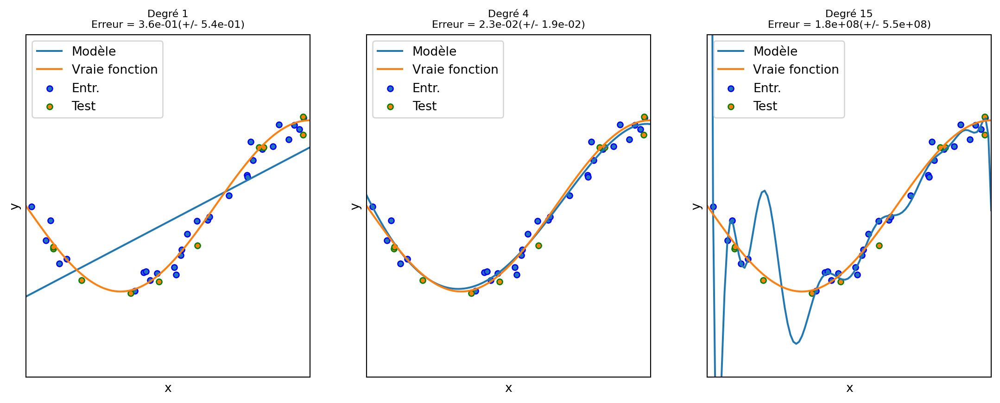

In [6]:
#| echo: false
#| label: fig-overfitting
#| fig-cap: Exemples de sur et sous-apprentissage.
import matplotlib.pyplot as plt
import numpy as np

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures


def true_fun(X):
    return np.cos(1.5 * np.pi * X+np.pi/2)


np.random.seed(0)
noise_level= 0.1
n_samples = 30
degrees = [1,4, 15]
#degrees= range(1,16)
X = np.sort(np.random.rand(n_samples))
y = true_fun(X) + np.random.randn(n_samples) * noise_level

X_test = np.sort(np.random.rand(10))
y_test = true_fun(X_test) + np.random.randn(int(10)) * noise_level

plt.figure(figsize=(14, 5))
results= []
for i in range(len(degrees)):
    ax = plt.subplot(1, len(degrees), i + 1)
    plt.setp(ax, xticks=(), yticks=())

    polynomial_features = PolynomialFeatures(degree=degrees[i], include_bias=False)
    linear_regression = LinearRegression()
    pipeline = Pipeline(
        [
            ("polynomial_features", polynomial_features),
            ("linear_regression", linear_regression),
        ]
    )
    pipeline.fit(X[:, np.newaxis], y)

    # Evaluate the models using crossvalidation
    scores = cross_validate(
        pipeline, X[:, np.newaxis], y, scoring="neg_mean_squared_error", cv=10, return_train_score=True
    )

    X_true = np.linspace(0, 1, 100)
    plt.plot(X_true, pipeline.predict(X_true[:, np.newaxis]), label="Modèle")
    plt.plot(X_true, true_fun(X_true), label="Vraie fonction")
    plt.scatter(X, y, edgecolor="b", s=20, label="Entr.")
    plt.scatter(X_test, y_test, edgecolor="g", s=20, label="Test")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.xlim((0, 1))
    plt.ylim((-2, 2))
    plt.legend(loc="best")
    plt.title(
        "Degré {}\nErreur = {:.1e}(+/- {:.1e})".format(
            degrees[i], -scores['test_score'].mean(), scores['test_score'].std()
        ), fontsize='small'
    )
    results.append([degrees[i], -scores['train_score'].mean(), -scores['test_score'].mean(),scores['train_score'].std(),scores['test_score'].std()])
plt.show()

In [7]:
couleurs_classes= {'NoData': 'black', 'Commercial': 'yellow', 'Nuages': 'lightgrey', 
                    'Foret': 'darkgreen', 'Faible_végétation': 'green', 'Sol_nu': 'saddlebrown',
                  'Roche': 'dimgray', 'Route': 'red', 'Urbain': 'orange', 'Eau': 'blue', 'Tourbe': 'salmon', 'Végétation éparse': 'darkgoldenrod', 'Roche avec végétation': 'darkseagreen'}
nom_classes= [*couleurs_classes.keys()]
couleurs_classes= [*couleurs_classes.values()]

Text(0.5, 1.0, "Carte d'occupation des sols")

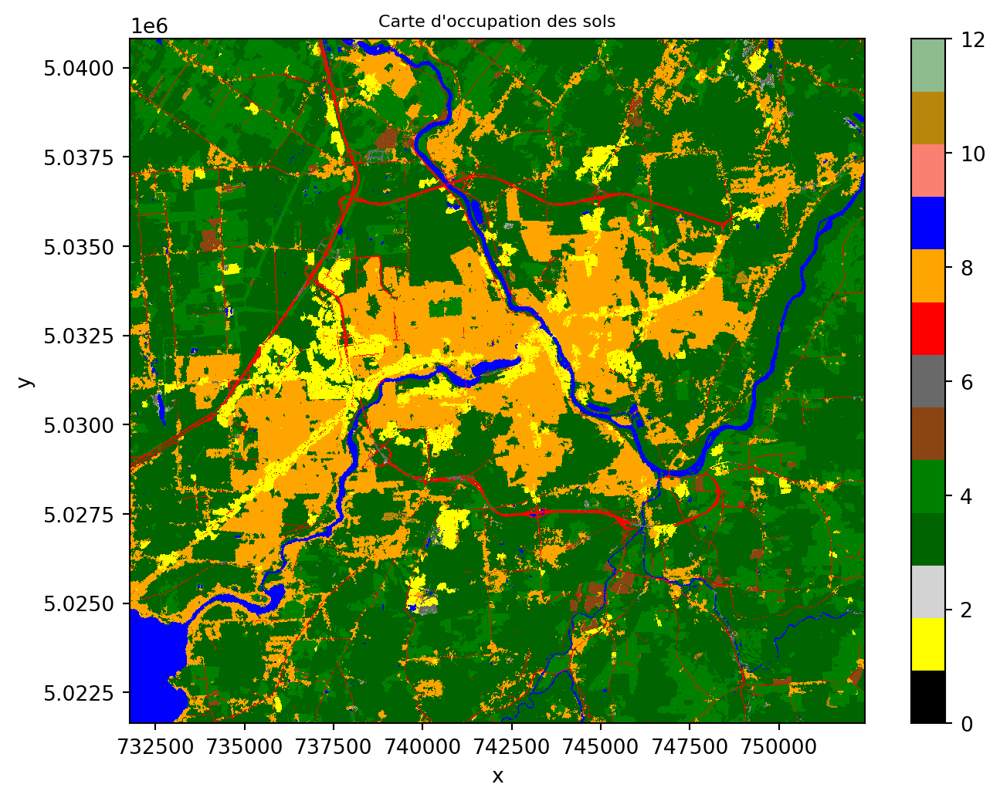

In [8]:
import matplotlib.pyplot as plt
import rioxarray as rxr
cmap_classes = ListedColormap(couleurs_classes)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 6))
img_carte.squeeze().plot.imshow(cmap=cmap_classes, vmin=0, vmax=12)
ax.set_title("Carte d'occupation des sols", fontsize="small")

In [9]:
img_carte= img_carte.squeeze() # nécessaire pour ignorer la dimension du canal
compte_classe = np.unique(img_carte.data, return_counts=True)
print(compte_classe)

(array([ 1.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 11., 12., nan],
      dtype=float32), array([ 193558, 2104777,  670158,   29523,   14624,   94751,  750046,
        123671,    9079,    4327,      10]))


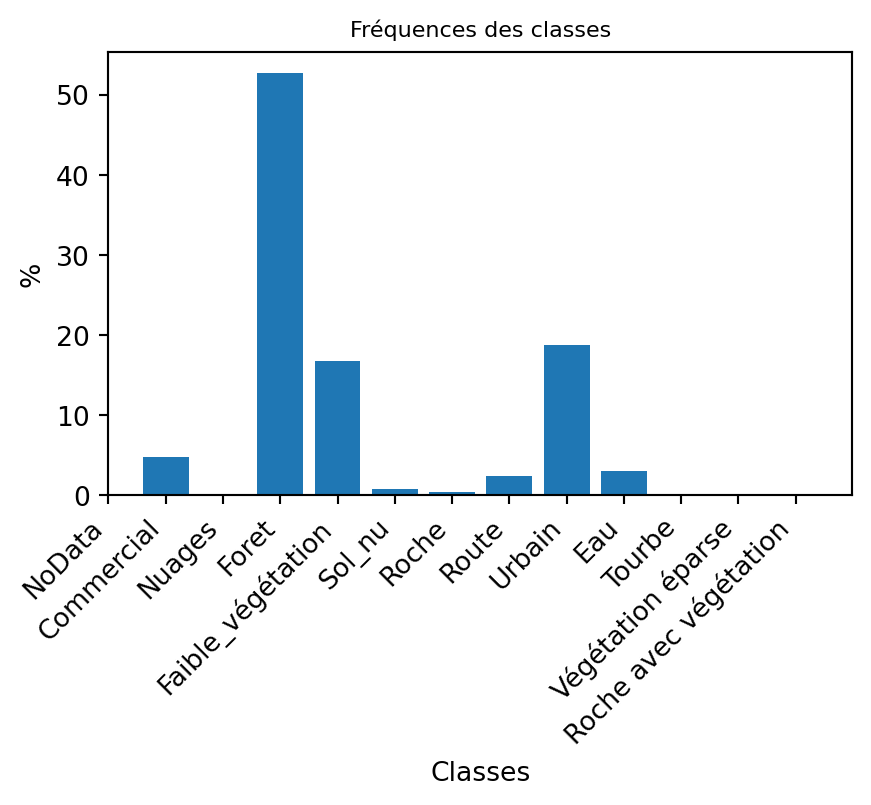

In [10]:
valeurs, comptes = compte_classe

# Create the histogram
plt.figure(figsize=(5, 3))
plt.bar(valeurs, comptes/comptes.sum()*100)
plt.xlabel("Classes")
plt.ylabel("%")
plt.title("Fréquences des classes", fontsize="small")
plt.xticks(range(len(nom_classes)), nom_classes, rotation=45, ha='right')
plt.show()

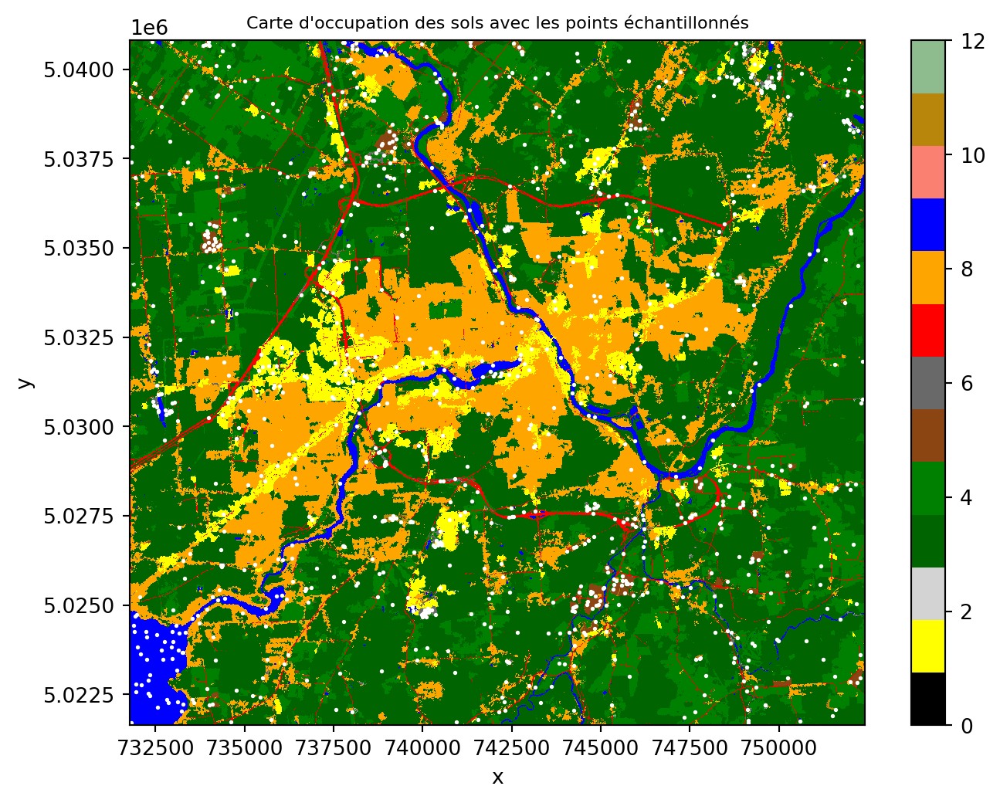

In [11]:
img_carte= img_carte.squeeze()
class_counts = np.unique(img_carte.data, return_counts=True)

# Liste vide des points échantillonnées
sampled_points = []
class_labels= [] # contient les étiquettes des classes
for class_label in range(1,13): # pour chacune des 12 classes
  # On cherche tous les pixels pour cette étiquette
  class_pixels = np.argwhere(img_carte.data == class_label)

  # On se limite à 100 pixels par classe
  n_samples = min(100, len(class_pixels))

  # On les choisit les positions aléatoirement
  np.random.seed(0) # ceci permet de répliquer le tirage aléatoire
  sampled_indices = np.random.choice(len(class_pixels), n_samples, replace=False)

  # On prends les positions en lignes, colonnes
  sampled_pixels = class_pixels[sampled_indices]

  # On ajoute les points à la liste
  sampled_points.extend(sampled_pixels)
  class_labels.extend(np.array([class_label]*n_samples)[:,np.newaxis])

# Conversion en NumPy array
sampled_points = np.array(sampled_points)
class_labels = np.array(class_labels)
# On peut naviguer les points à l'aide de la géoréférence
transformer = rasterio.transform.AffineTransformer(img_carte.rio.transform())
transform_sampled_points= transformer.xy(sampled_points[:,0], sampled_points[:,1])

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 6))
img_carte.squeeze().plot.imshow(cmap=cmap_classes, vmin=0, vmax=12)
ax.scatter(transform_sampled_points[0], transform_sampled_points[1], c='w', s=1)  # Plot sampled points
ax.set_title("Carte d'occupation des sols avec les points échantillonnés", fontsize="small")
plt.show()

In [12]:
points = [Point(xy) for xy in zip(transform_sampled_points[0], transform_sampled_points[1])]
gdf = geopandas.GeoDataFrame(range(1,len(points)+1), geometry=points, crs=img_carte.rio.crs)
coord_list = [(x, y) for x, y in zip(gdf["geometry"].x, gdf["geometry"].y)]
with rasterio.open('RGBNIR_of_S2A.tif') as src:
  gdf["value"] = [x for x in src.sample(coord_list)]
gdf['class']= class_labels
gdf.to_csv('sampling_points.csv') # sauvegarde sous forme d'un format csv
gdf.head()

,0,geometry,value,class
0,1,POINT (740369.77 5032078.683),"[1894, 1994, 2112, 2318]",1
1,2,POINT (737542.924 5031770.119),"[1440, 1650, 1449, 5021]",1
2,3,POINT (736726.722 5031411.786),"[1666, 1972, 1819, 3437]",1
3,4,POINT (736816.305 5027470.128),"[1858, 2078, 2190, 2436]",1
4,5,POINT (736746.629 5031362.018),"[2194, 2304, 2268, 3075]",1


In [13]:
def bhattacharyya_distance(m1, s1, m2, s2):
    # Calcul de la covariance moyenne
    s = (s1 + s2) / 2
    
    # Calcul du premier terme (différence des moyennes)
    m_diff = m1 - m2
    term1 = np.dot(np.dot(m_diff.T, np.linalg.inv(s)), m_diff) / 8
    
    # Calcul du second terme (différence de covariances)
    term2 = 0.5 * np.log(np.linalg.det(s) / np.sqrt(np.linalg.det(s1) * np.linalg.det(s2)))
    
    return term1 + term2

def jeffries_matusita_distance(m1, s1, m2, s2):
    B = bhattacharyya_distance(m1, s1, m2, s2)
    return 2 * (1 - np.exp(-B))

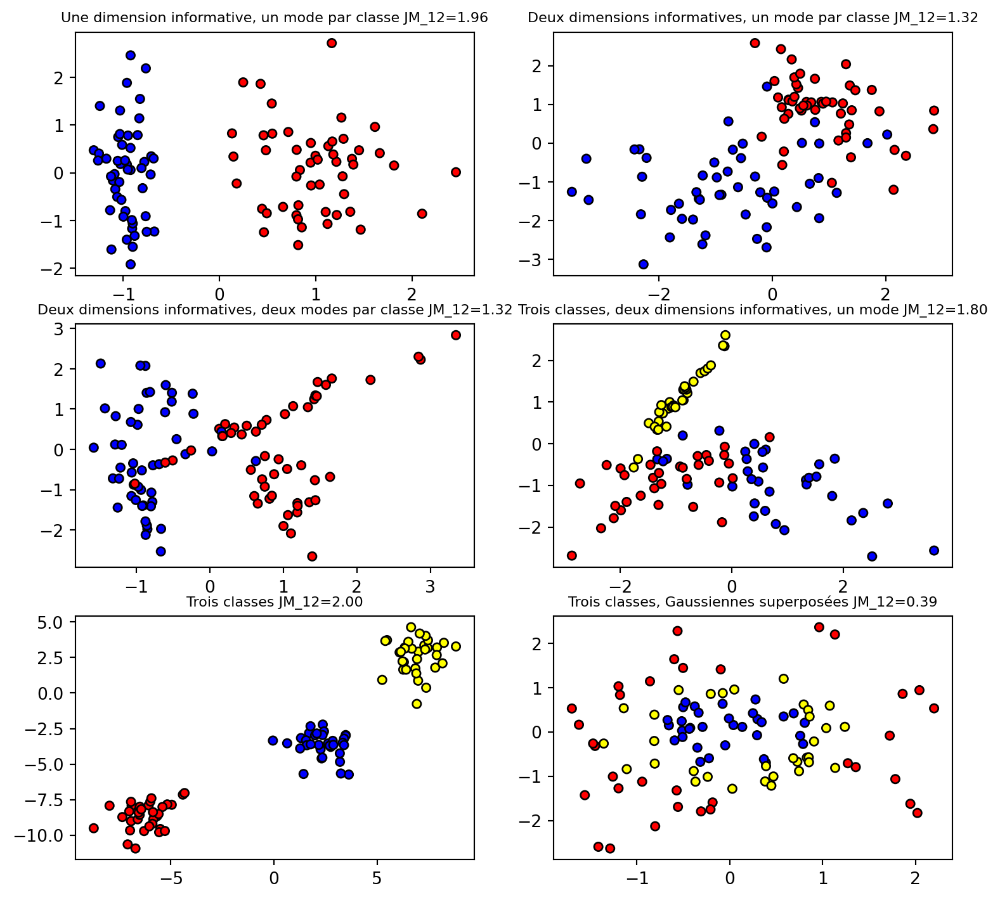

In [14]:
#| echo: false
#| warning: false
import matplotlib.pyplot as plt

from sklearn.datasets import make_blobs, make_classification, make_gaussian_quantiles


cmap_classes = ListedColormap( ['blue','yellow','red'])

np.random.seed(42)
plt.figure(figsize=(8, 8))
plt.subplots_adjust(bottom=0.05, top=0.9, left=0.05, right=0.95)

plt.subplot(321)

X1, Y1 = make_classification(
    n_features=2, n_redundant=0, n_informative=1, n_clusters_per_class=1
)
qda = QuadraticDiscriminantAnalysis(store_covariance=True)
qda.fit(X1, Y1)
jm=jeffries_matusita_distance(qda.means_[0], qda.covariance_[0], qda.means_[1], qda.covariance_[1])
plt.title(f"Une dimension informative, un mode par classe JM_12={jm:3.2f}", fontsize="small")
plt.scatter(X1[:, 0], X1[:, 1], marker="o", c=Y1, s=25, edgecolor="k", cmap=cmap_classes)

plt.subplot(322)

X1, Y1 = make_classification(
    n_features=2, n_redundant=0, n_informative=2, n_clusters_per_class=1
)
qda = QuadraticDiscriminantAnalysis(store_covariance=True)
qda.fit(X1, Y1)
jm=jeffries_matusita_distance(qda.means_[0], qda.covariance_[0], qda.means_[1], qda.covariance_[1])
plt.title(f"Deux dimensions informatives, un mode par classe JM_12={jm:3.2f}", fontsize="small")
plt.scatter(X1[:, 0], X1[:, 1], marker="o", c=Y1, s=25, edgecolor="k", cmap=cmap_classes)

plt.subplot(323)

X2, Y2 = make_classification(n_features=2, n_redundant=0, n_informative=2)
qda = QuadraticDiscriminantAnalysis(store_covariance=True)
qda.fit(X1, Y1)
jm=jeffries_matusita_distance(qda.means_[0], qda.covariance_[0], qda.means_[1], qda.covariance_[1])
plt.title(f"Deux dimensions informatives, deux modes par classe JM_12={jm:3.2f}", fontsize="small")
plt.scatter(X2[:, 0], X2[:, 1], marker="o", c=Y2, s=25, edgecolor="k", cmap=cmap_classes)

plt.subplot(324)

X1, Y1 = make_classification(
    n_features=2, n_redundant=0, n_informative=2, n_clusters_per_class=1, n_classes=3
)
qda = QuadraticDiscriminantAnalysis(store_covariance=True)
qda.fit(X1, Y1)
jm=jeffries_matusita_distance(qda.means_[0], qda.covariance_[0], qda.means_[1], qda.covariance_[1])
plt.title(f"Trois classes, deux dimensions informatives, un mode JM_12={jm:3.2f}", fontsize="small")
plt.scatter(X1[:, 0], X1[:, 1], marker="o", c=Y1, s=25, edgecolor="k", cmap=cmap_classes)

plt.subplot(325)

X1, Y1 = make_blobs(n_features=2, centers=3)
qda = QuadraticDiscriminantAnalysis(store_covariance=True)
qda.fit(X1, Y1)
jm=jeffries_matusita_distance(qda.means_[0], qda.covariance_[0], qda.means_[1], qda.covariance_[1])
plt.title(f"Trois classes JM_12={jm:3.2f}", fontsize="small")
plt.scatter(X1[:, 0], X1[:, 1], marker="o", c=Y1, s=25, edgecolor="k", cmap=cmap_classes)

plt.subplot(326)

X1, Y1 = make_gaussian_quantiles(n_features=2, n_classes=3)
qda = QuadraticDiscriminantAnalysis(store_covariance=True)
qda.fit(X1, Y1)
jm=jeffries_matusita_distance(qda.means_[0], qda.covariance_[0], qda.means_[1], qda.covariance_[1])
plt.title(f"Trois classes, Gaussiennes superposées JM_12={jm:3.2f}", fontsize="small")
plt.scatter(X1[:, 0], X1[:, 1], marker="o", c=Y1, s=25, edgecolor="k", cmap=cmap_classes)

plt.show()

In [15]:
df= pd.read_csv('sampling_points.csv')
# Extraire la colonne 'value'.
# 'value' est une chaîne de caractères représentation d'une liste de nombres.
# Nous devons la convertir en données numériques réelles.
X = df['value'].apply(lambda x: np.fromstring(x[1:-1], dtype=float, sep=' ')).to_list()

# on obtient une liste de numpy array  qu'il faut convertir en un numpy array 2D
X= np.array([row.tolist() for row in X])
idx= X.sum(axis=-1)>0 # on exclut certains points sans valeurs
X= X[idx,...]
y = df['class'].to_numpy()
y= y[idx]
class_labels = np.unique(y).tolist() # on cherche à savoir combien de classes uniques
n_classes = len(class_labels)
if max(class_labels) > n_classes: # il se peut que certaines classes soit absentes
  y_new= []
  for i,l in enumerate(class_labels):
    y_new.extend([i]*sum(y==l))
  y_new = np.array(y_new)

couleurs_classes2= [couleurs_classes[c] for c in np.unique(y).tolist()] # couleurs des classes
nom_classes2= [nom_classes[c] for c in np.unique(y).tolist()]
cmap_classes2 = ListedColormap(couleurs_classes2)

In [16]:
qda= QuadraticDiscriminantAnalysis(store_covariance=True)
qda.fit(X, y_new) # calcul des paramètres des distributions Gaussiennes
JM= []
classes= np.unique(y_new).tolist() # étiquettes uniques des classes
for cl1 in classes:
  for cl2 in classes:
    JM.append(jeffries_matusita_distance(qda.means_[cl1], qda.covariance_[cl1], qda.means_[cl2], qda.covariance_[cl2]))

JM= np.array(JM).reshape(len(classes),len(classes))
JM= pd.DataFrame(JM, index=classes, columns=classes)
JM.head(10)

,0,1,2,3,4,5,6,7,8,9
0,0.000000,1.931891,1.809590,1.761760,1.156486,1.326107,1.319344,1.830671,1.873676,1.700417
1,1.931891,0.000000,1.082978,0.918865,1.788737,1.527192,1.331400,1.901749,0.854802,1.133180
2,1.809590,1.082978,0.000000,0.266647,1.428062,1.255001,1.198888,1.947302,0.193032,0.782982
3,1.761760,0.918865,0.266647,0.000000,1.413401,1.219793,1.127950,1.929637,0.377379,0.840250
4,1.156486,1.788737,1.428062,1.413401,0.000000,0.397103,0.596618,1.956182,1.517926,1.036828
5,1.326107,1.527192,1.255001,1.219793,0.397103,0.000000,0.167221,1.976696,1.248383,0.660213
6,1.319344,1.331400,1.198888,1.127950,0.596618,0.167221,0.000000,1.956804,1.207618,0.660589
7,1.830671,1.901749,1.947302,1.929637,1.956182,1.976696,1.956804,0.000000,1.966022,1.886064
8,1.873676,0.854802,0.193032,0.377379,1.517926,1.248383,1.207618,1.966022,0.000000,0.741273
9,1.700417,1.133180,0.782982,0.840250,1.036828,0.660213,0.660589,1.886064,0.741273,0.000000


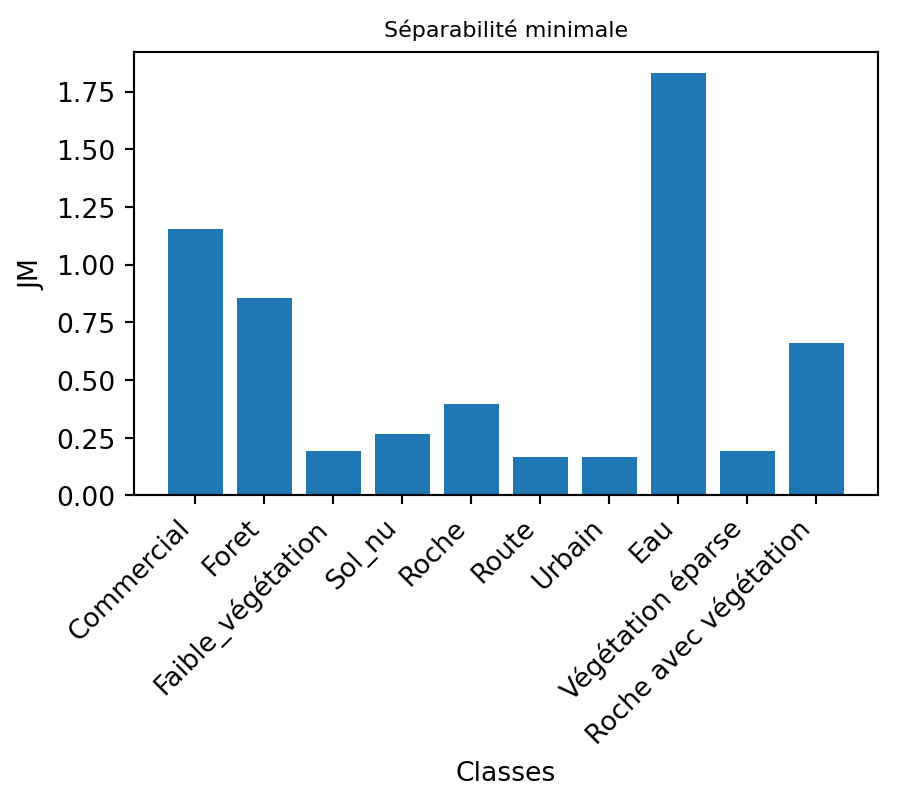

In [17]:
#| echo: false
#| warning: false
plt.figure(figsize=(5, 3))
plt.bar(range(JM.shape[0]), np.min(JM[JM>0],axis=1))
plt.xlabel("Classes")
plt.ylabel("JM")
plt.title("Séparabilité minimale", fontsize="small")
plt.xticks(range(len(nom_classes2)), nom_classes2, rotation=45, ha='right')
plt.show()

In [18]:
y_true = ["cat", "ant", "cat", "cat", "ant", "bird", "bird"]
y_pred = ["ant", "ant", "cat", "cat", "ant", "cat", "bird"]
confusion_matrix(y_true, y_pred, labels=["ant", "bird", "cat"])

array([[2, 0, 0],
       [0, 1, 1],
       [1, 0, 2]])

In [19]:
y_true = ["cat", "ant", "cat", "cat", "ant", "bird", "bird"]
y_pred = ["ant", "ant", "cat", "cat", "ant", "cat", "bird"]
print(classification_report(y_true, y_pred, target_names=["ant", "bird", "cat"]))

              precision    recall  f1-score   support

         ant       0.67      1.00      0.80         2
        bird       1.00      0.50      0.67         2
         cat       0.67      0.67      0.67         3

    accuracy                           0.71         7
   macro avg       0.78      0.72      0.71         7
weighted avg       0.76      0.71      0.70         7



In [20]:
def parrallepiped_train(X_train, y_train):
  classes= np.unique(y_train).tolist()
  clf= []
  for cl in classes:
      data_cl= X_train[y_train == cl,...] # on cherche les données pour la classe courante
      
      limits=[]
      for b in range(data_cl.shape[1]):
        limits.append([data_cl[:,b].min(), data_cl[:,b].max()]) # on calcul le min et max pour chaque bande
      clf.append(np.array(limits))
  return clf
clf= parrallepiped_train(X, y_new)

In [21]:
@jit(nopython=True)
def parrallepiped_predict(clf, X_test):
  y_pred= []
  for data in X_test:
    y_pred.append(np.nan)
    for cl, limits in enumerate(clf):
      inside= True
      for b,limit in enumerate(limits):
        inside = inside and (data[b] >= limit[0]) & (data[b] <= limit[1])
        if ~inside:
          break
      if inside:
        y_pred[-1]=cl
  return np.array(y_pred)

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


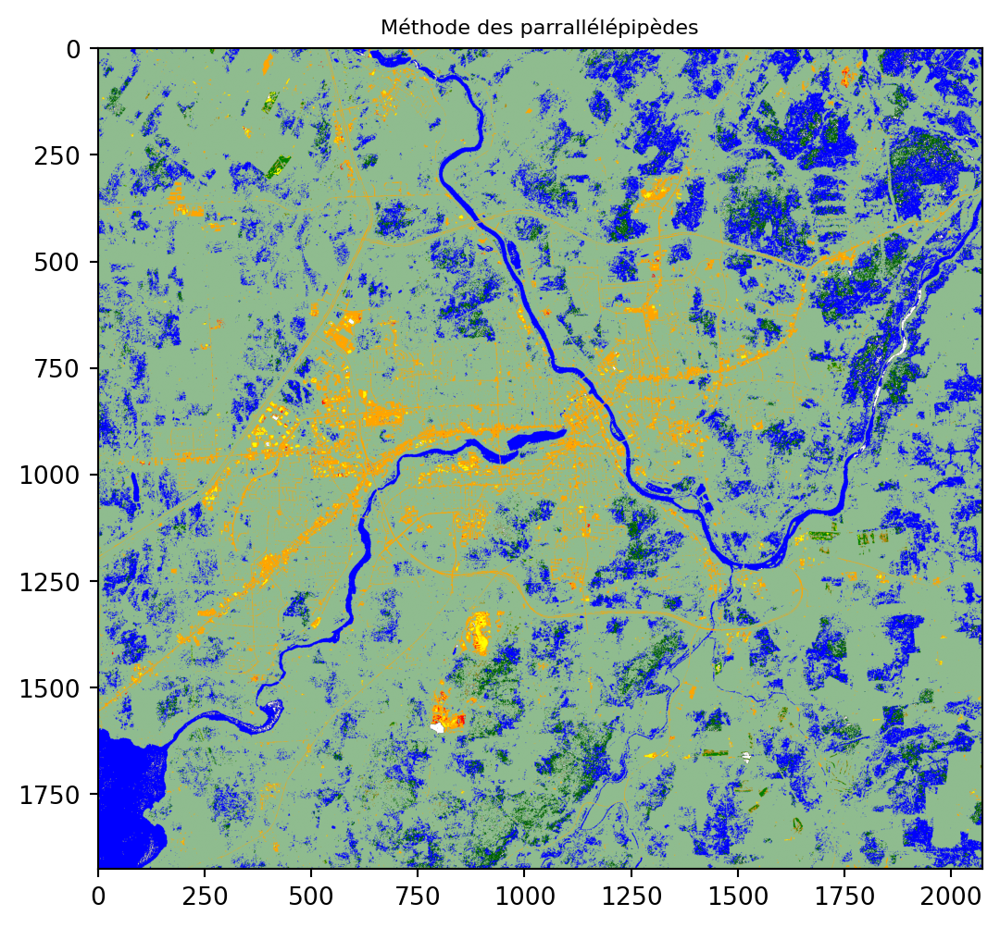

In [22]:
data_image= img_rgbnir.to_numpy().transpose(1,2,0).reshape(img_rgbnir.shape[1]*img_rgbnir.shape[2],4)
y_image= parrallepiped_predict(clf, data_image)
y_image= y_image.reshape(img_rgbnir.shape[1],img_rgbnir.shape[2])

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 6))
plt.imshow(y_image, cmap=cmap_classes2)
ax.set_title("Méthode des parrallélépipèdes", fontsize="small")
plt.show()

In [23]:
y_pred= parrallepiped_predict(clf, X)
nom_classes2= [nom_classes[c] for c in np.unique(y).tolist()]
print(classification_report(y_new, y_pred, target_names=nom_classes2, zero_division=np.nan))

                       precision    recall  f1-score   support

           Commercial       1.00      0.06      0.11       100
                Foret       1.00      0.09      0.17       100
    Faible_végétation       1.00      0.02      0.04       100
               Sol_nu        nan      0.00      0.00       100
                Roche       0.00      0.00      0.00       100
                Route       0.00      0.00      0.00       100
               Urbain       0.08      0.08      0.08       100
                  Eau       0.83      0.88      0.85       100
    Végétation éparse       1.00      0.01      0.02       100
Roche avec végétation       0.13      1.00      0.23       100

             accuracy                           0.21      1000
            macro avg       0.56      0.21      0.15      1000
         weighted avg       0.56      0.21      0.15      1000



In [24]:
df= pd.read_csv('sampling_points.csv')
# Extraire la colonne 'value'.
# 'value' est une chaîne de caractères comme représentation d'une liste de valeurs.
# Nous devons la convertir en données numériques réelles.
X = df['value'].apply(lambda x: np.fromstring(x[1:-1], dtype=float, sep=' ')).to_list()

# on obtient une liste de numpy array  qu'il faut convertir en un numpy array 2D
X= np.array([row.tolist() for row in X])
idx= X.sum(axis=-1)>0 # il se peut qu'il y ait des valeurs erronées
X= X[idx,...]
y = df['class'].to_numpy()
y= y[idx]
class_labels = np.unique(y).tolist() # on cherche à savoir combien de classes uniques
n_classes = len(class_labels)
if max(class_labels) > n_classes: # il se peut que certaines classes soit absentes
  y_new= []
  for i,l in enumerate(class_labels):
    y_new.extend([i]*sum(y==l))
  y_new = np.array(y_new)
nom_classes2= [nom_classes[c] for c in np.unique(y).tolist()]

In [25]:
clf = Pipeline(
    steps=[("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=1))]
)

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y_new, test_size=0.2, random_state=0)

Number of mislabeled points out of a total 200 points : 143
Number of mislabeled points out of a total 200 points : 141
Number of mislabeled points out of a total 200 points : 136
Number of mislabeled points out of a total 200 points : 130


/home/sfoucher/miniconda3/lib/python3.10/site-packages/sklearn/inspection/_plot/decision_boundary.py:194: UserWarning:

The following kwargs were not used by contour: 'shading'

/home/sfoucher/miniconda3/lib/python3.10/site-packages/sklearn/inspection/_plot/decision_boundary.py:194: UserWarning:

The following kwargs were not used by contour: 'shading'

/home/sfoucher/miniconda3/lib/python3.10/site-packages/sklearn/inspection/_plot/decision_boundary.py:194: UserWarning:

The following kwargs were not used by contour: 'shading'

/home/sfoucher/miniconda3/lib/python3.10/site-packages/sklearn/inspection/_plot/decision_boundary.py:194: UserWarning:

The following kwargs were not used by contour: 'shading'



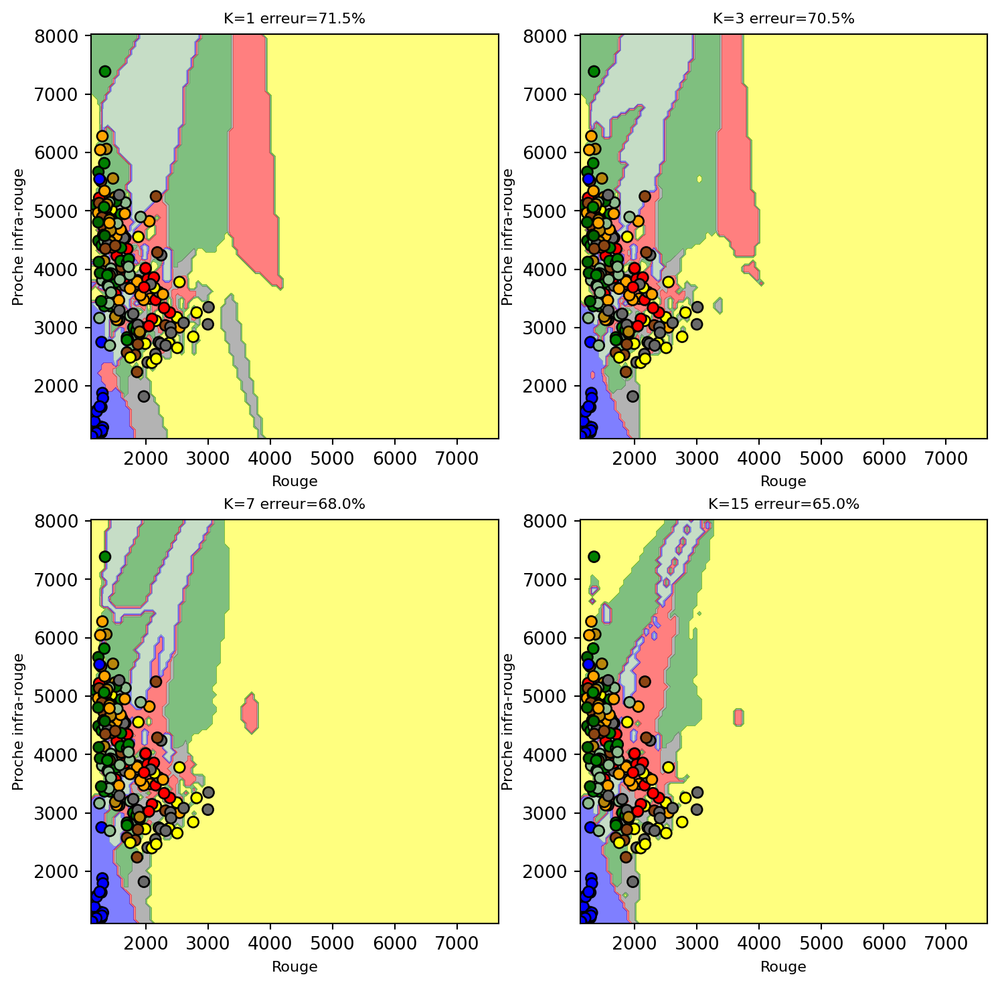

In [27]:
#| echo: false
#| warning: false

_, axs = plt.subplots(nrows=2,ncols=2, figsize=(9,9))
couleurs_classes2= [couleurs_classes[c] for c in np.unique(y).tolist()]
cmap_classes2 = ListedColormap(couleurs_classes2)
for ax, K in zip(axs.flatten(), [1,3,7,15]):
    clf.set_params(knn__weights='distance', knn__n_neighbors = K).fit(X_train[:,2:4], y_train)
    y_pred = clf.predict(X_test[:,2:4])
    print("Number of mislabeled points out of a total %d points : %d"
      % (X_test.shape[0], (y_test != y_pred).sum()))
    disp = DecisionBoundaryDisplay.from_estimator(
        clf,
        X[:,2:4],
        response_method="predict",
        plot_method="contourf",
        shading="auto",
        alpha=0.5,
        ax=ax,
        cmap= cmap_classes2,
    )
    scatter = disp.ax_.scatter(X_test[:, 2], X_test[:, 3], c=y_test, edgecolors="k", cmap=cmap_classes2)
    disp.ax_.set_xlabel('Rouge', fontsize="small")
    disp.ax_.set_ylabel('Proche infra-rouge', fontsize="small")
    _ = disp.ax_.set_title(
        f"K={clf[-1].n_neighbors} erreur={(y_test != y_pred).sum()/X_test.shape[0]*100:3.1f}%", fontsize="small"
    )

plt.show()

In [28]:
clf.set_params(knn__weights='distance', knn__n_neighbors = 7).fit(X_train, y_train)
y_pred = clf.predict(X_test)
print("Nombre de points misclassifiés sur %d points : %d"
  % (X_test.shape[0], (y_test != y_pred).sum()))

Nombre de points misclassifiés sur 200 points : 117


In [29]:
nom_classes2= [nom_classes[c] for c in np.unique(y).tolist()]
print(classification_report(y_test, y_pred, target_names=nom_classes2, zero_division=np.nan))

                       precision    recall  f1-score   support

           Commercial       0.38      0.40      0.39        15
                Foret       0.45      0.82      0.58        11
    Faible_végétation       0.29      0.15      0.20        27
               Sol_nu       0.53      0.45      0.49        22
                Roche       0.38      0.26      0.31        23
                Route       0.16      0.17      0.16        18
               Urbain       0.25      0.20      0.22        20
                  Eau       0.96      0.96      0.96        24
    Végétation éparse       0.26      0.53      0.35        15
Roche avec végétation       0.40      0.40      0.40        25

             accuracy                           0.41       200
            macro avg       0.40      0.43      0.40       200
         weighted avg       0.42      0.41      0.40       200



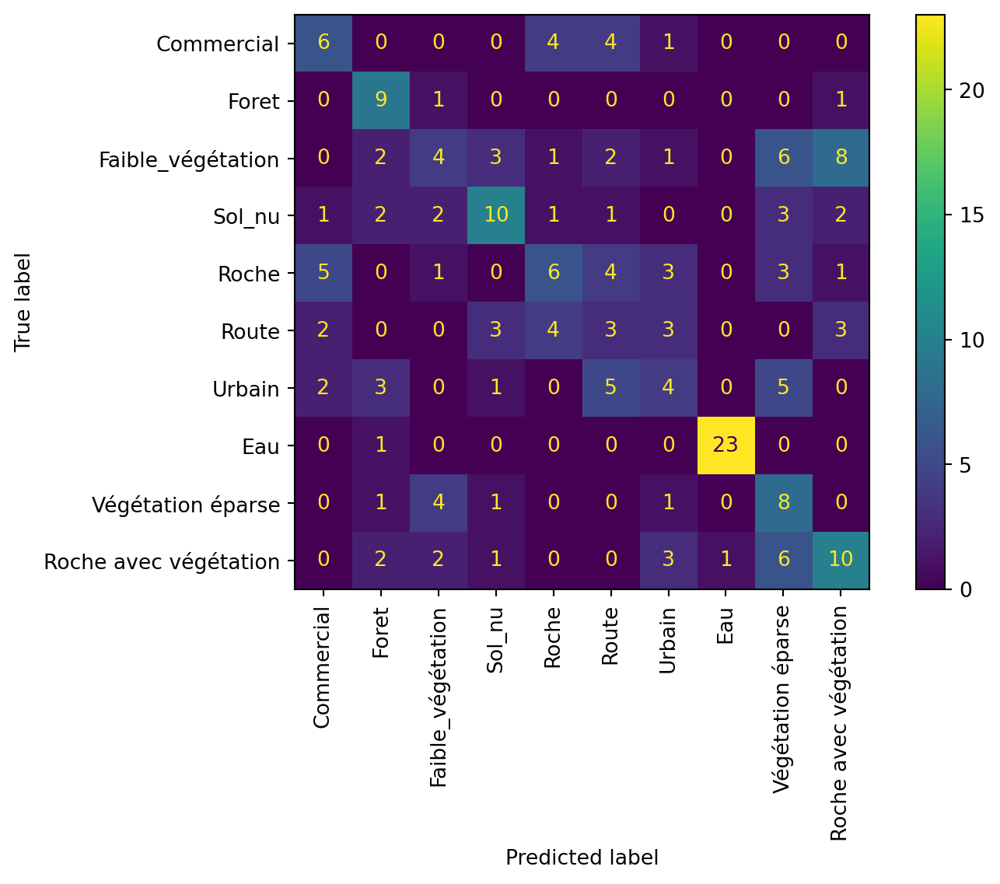

In [30]:
disp= ConfusionMatrixDisplay.from_predictions(y_test, y_pred, display_labels=nom_classes2, xticks_rotation='vertical')

In [31]:
data_image= img_rgbnir.to_numpy().transpose(1,2,0).reshape(img_rgbnir.shape[1]*img_rgbnir.shape[2],4)
y_classe= clf.predict(data_image)
y_classe= y_classe.reshape(img_rgbnir.shape[1],img_rgbnir.shape[2])

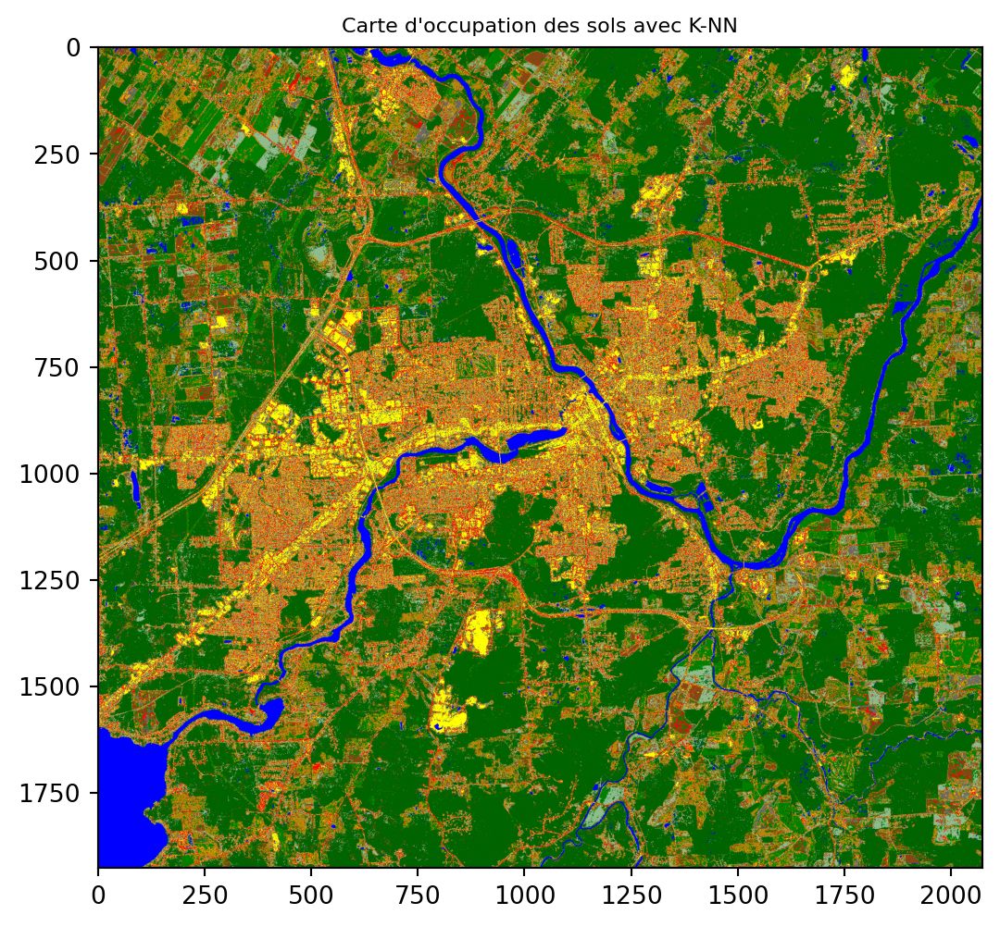

In [32]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 6))
plt.imshow(y_classe, cmap=cmap_classes2)
ax.set_title("Carte d'occupation des sols avec K-NN", fontsize="small")
plt.show()

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

Number of mislabeled points out of a total 200 points : 167
Number of mislabeled points out of a total 200 points : 154
Number of mislabeled points out of a total 200 points : 143
Number of mislabeled points out of a total 200 points : 128


/home/sfoucher/miniconda3/lib/python3.10/site-packages/sklearn/inspection/_plot/decision_boundary.py:194: UserWarning:

The following kwargs were not used by contour: 'shading'

/home/sfoucher/miniconda3/lib/python3.10/site-packages/sklearn/inspection/_plot/decision_boundary.py:194: UserWarning:

The following kwargs were not used by contour: 'shading'

/home/sfoucher/miniconda3/lib/python3.10/site-packages/sklearn/inspection/_plot/decision_boundary.py:194: UserWarning:

The following kwargs were not used by contour: 'shading'

/home/sfoucher/miniconda3/lib/python3.10/site-packages/sklearn/inspection/_plot/decision_boundary.py:194: UserWarning:

The following kwargs were not used by contour: 'shading'



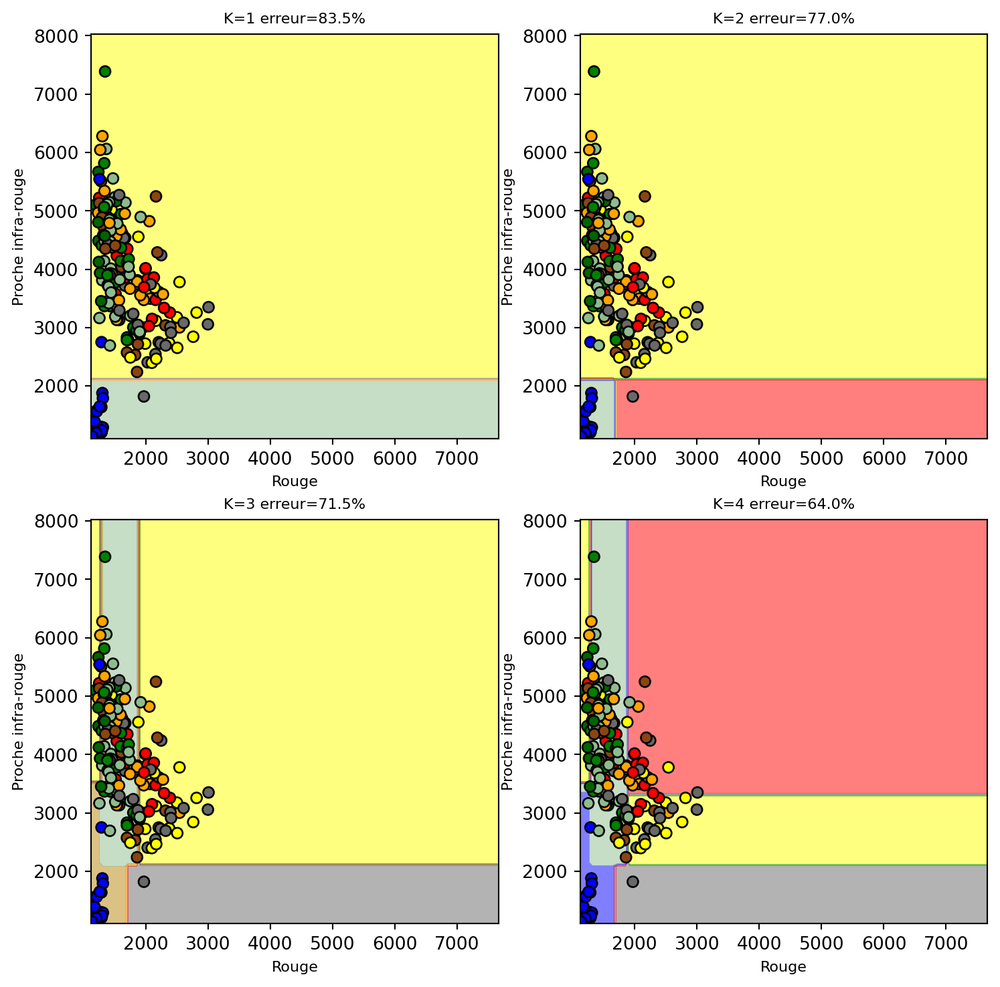

In [34]:
#| echo: false
#| warning: false
from sklearn import tree

_, axs = plt.subplots(nrows=2,ncols=2, figsize=(9,9))
couleurs_classes2= [couleurs_classes[c] for c in np.unique(y).tolist()]
cmap_classes2 = ListedColormap(couleurs_classes2)
clf = tree.DecisionTreeClassifier()
for ax, K in zip(axs.flatten(), [1,2,3,4]):
    clf.set_params(max_depth = K).fit(X_train[:,2:4], y_train)
    y_pred = clf.predict(X_test[:,2:4])
    print("Number of mislabeled points out of a total %d points : %d"
      % (X_test.shape[0], (y_test != y_pred).sum()))
    disp = DecisionBoundaryDisplay.from_estimator(
        clf,
        X[:,2:4],
        response_method="predict",
        plot_method="contourf",
        shading="auto",
        alpha=0.5,
        ax=ax,
        cmap= cmap_classes2,
    )
    scatter = disp.ax_.scatter(X_test[:, 2], X_test[:, 3], c=y_test, edgecolors="k", cmap=cmap_classes2)
    disp.ax_.set_xlabel('Rouge', fontsize="small")
    disp.ax_.set_ylabel('Proche infra-rouge', fontsize="small")
    _ = disp.ax_.set_title(
        f"K={K} erreur={(y_test != y_pred).sum()/X_test.shape[0]*100:3.1f}%", fontsize="small"
    )

plt.show()

In [35]:
clf = tree.DecisionTreeClassifier(max_depth=5)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print("Nombre de points misclassifiés sur %d points : %d"
  % (X_test.shape[0], (y_test != y_pred).sum()))

Nombre de points misclassifiés sur 200 points : 130


In [36]:
#| echo: false
#| warning: false
print(classification_report(y_test, y_pred, target_names=nom_classes2, zero_division=np.nan))

                       precision    recall  f1-score   support

           Commercial       0.37      0.47      0.41        15
                Foret       0.57      0.73      0.64        11
    Faible_végétation       0.19      0.19      0.19        27
               Sol_nu       0.57      0.18      0.28        22
                Roche       0.40      0.09      0.14        23
                Route       0.32      0.44      0.37        18
               Urbain        nan      0.00      0.00        20
                  Eau       0.95      0.79      0.86        24
    Végétation éparse        nan      0.00      0.00        15
Roche avec végétation       0.20      0.68      0.31        25

             accuracy                           0.35       200
            macro avg       0.45      0.36      0.32       200
         weighted avg       0.44      0.35      0.31       200



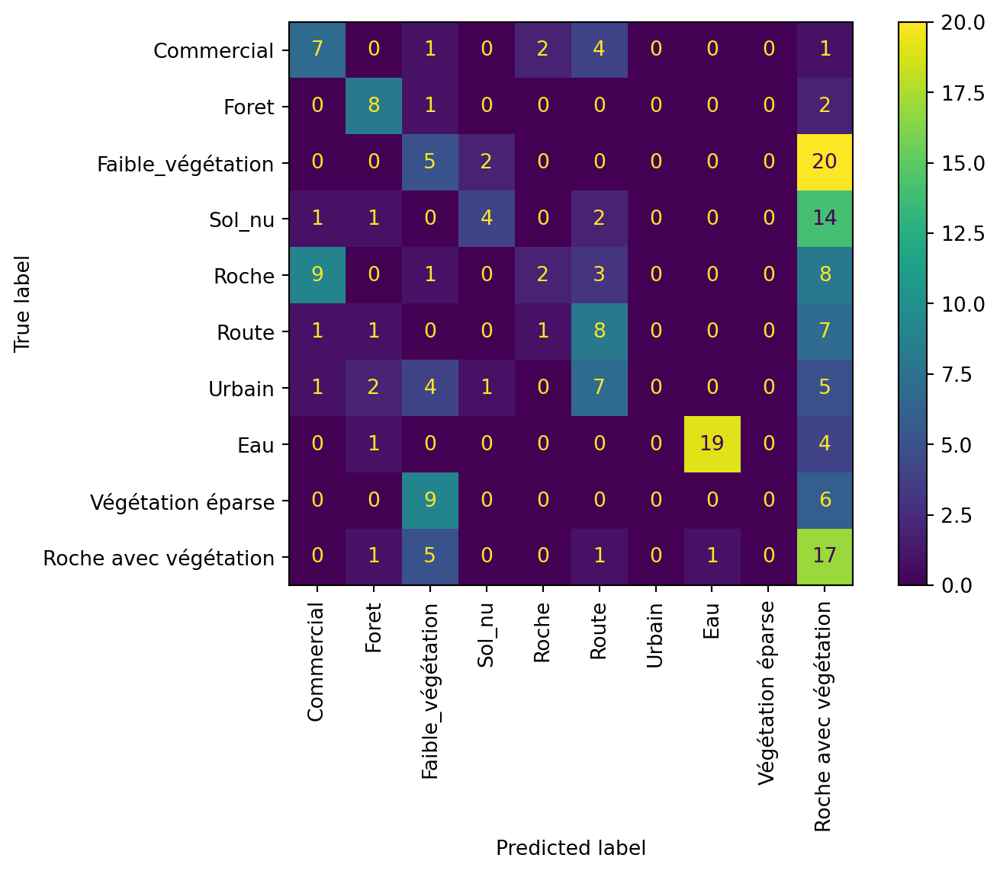

In [37]:
#| echo: false
#| warning: false
disp= ConfusionMatrixDisplay.from_predictions(y_test, y_pred, display_labels=nom_classes2, xticks_rotation='vertical')

In [38]:
#| echo: false
#| output: false
#| warning: false
data_image= img_rgbnir.to_numpy().transpose(1,2,0).reshape(img_rgbnir.shape[1]*img_rgbnir.shape[2],4)
y_classe= clf.predict(data_image)
y_classe= y_classe.reshape(img_rgbnir.shape[1],img_rgbnir.shape[2])

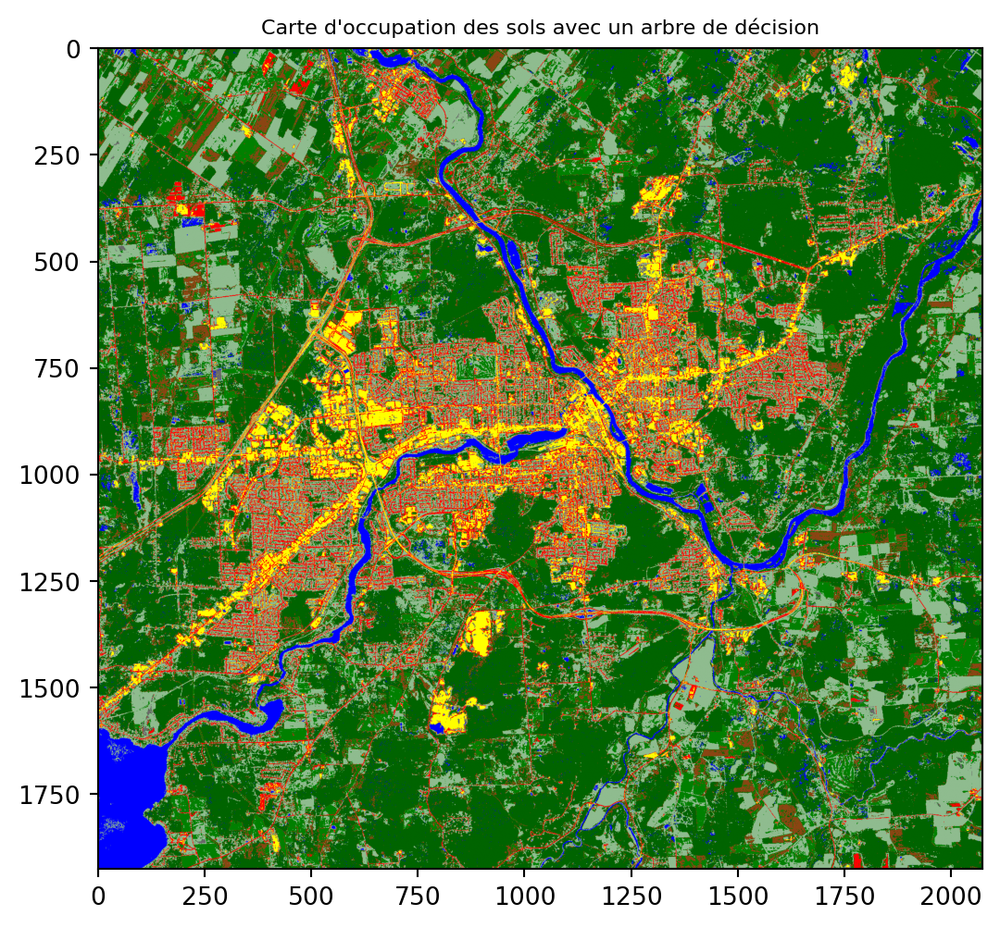

In [39]:
#| echo: false
#| warning: false
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 6))
plt.imshow(y_classe, cmap=cmap_classes2)
ax.set_title("Carte d'occupation des sols avec un arbre de décision", fontsize="small")
plt.show()

[Text(0.5, 0.8333333333333334, 'x[3] <= 2139.0\ngini = 0.9\nsamples = 800\nvalue = [85, 89, 73, 78, 77, 82, 80, 76, 85, 75]'),
 Text(0.25, 0.5, 'x[2] <= 1714.0\ngini = 0.055\nsamples = 71\nvalue = [0, 0, 0, 0, 1, 0, 0, 69, 0, 1]'),
 Text(0.375, 0.6666666666666667, 'True  '),
 Text(0.125, 0.16666666666666666, '\n  (...)  \n'),
 Text(0.375, 0.16666666666666666, '\n  (...)  \n'),
 Text(0.75, 0.5, 'x[2] <= 1277.0\ngini = 0.89\nsamples = 729\nvalue = [85.0, 89.0, 73.0, 78.0, 76.0, 82.0, 80.0, 7.0, 85.0\n74.0]'),
 Text(0.625, 0.6666666666666667, '  False'),
 Text(0.625, 0.16666666666666666, '\n  (...)  \n'),
 Text(0.875, 0.16666666666666666, '\n  (...)  \n')]

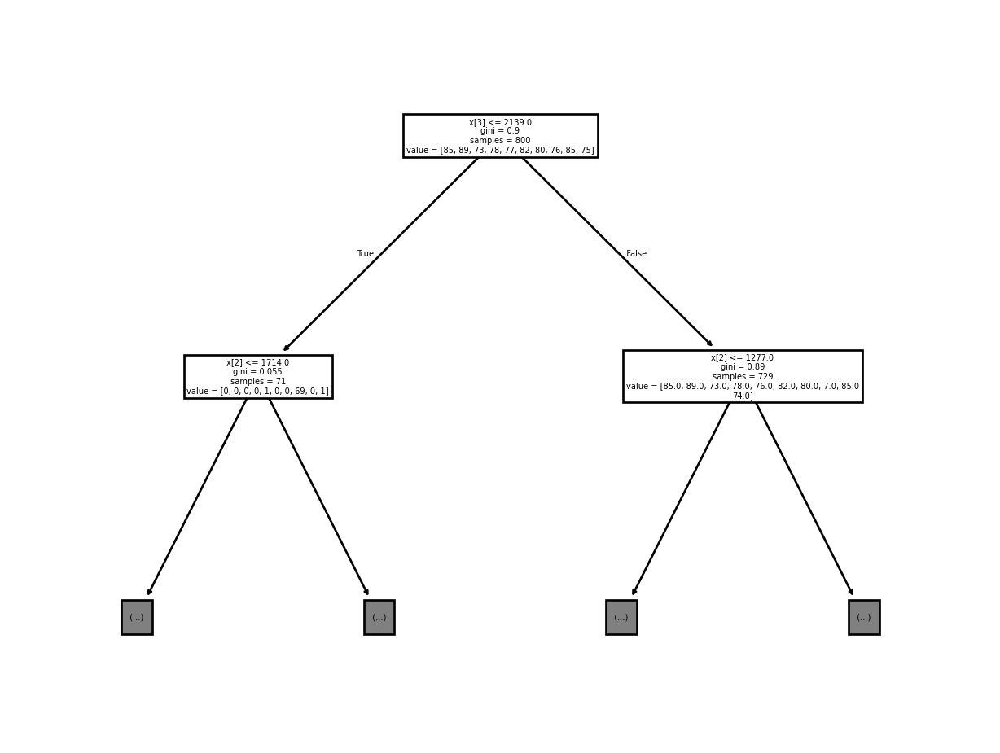

In [40]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 6))
tree.plot_tree(clf, max_depth=1)

In [41]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)
print("Nombre de points erronés sur %d points : %d"
      % (X_test.shape[0], (y_test != y_pred).sum()))

Nombre de points erronés sur 200 points : 131


/home/sfoucher/miniconda3/lib/python3.10/site-packages/sklearn/inspection/_plot/decision_boundary.py:194: UserWarning:

The following kwargs were not used by contour: 'shading'



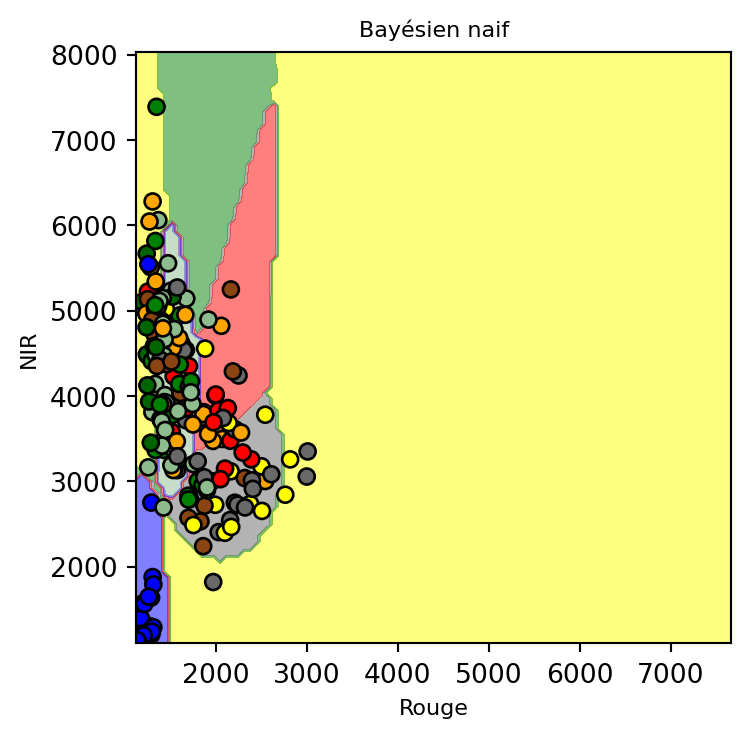

In [42]:
#| echo: false
#| warning: false
_, axs = plt.subplots(nrows=1,ncols=1, figsize=(4, 4))
couleurs_classes2= [couleurs_classes[c] for c in np.unique(y).tolist()]
cmap_classes2 = ListedColormap(couleurs_classes2)

#clf.set_params(knn__weights='distance', knn__n_neighbors = K).fit(X_train[:,2:4], y_train)
gnb= gnb.fit(X_train[:,2:4], y_train)
disp = DecisionBoundaryDisplay.from_estimator(
    gnb,
    X[:,2:4],
    response_method="predict",
    plot_method="contourf",
    shading="auto",
    alpha=0.5,
    ax=axs,
    cmap= cmap_classes2,
)
scatter = disp.ax_.scatter(X_test[:, 2], X_test[:, 3], c=y_test, edgecolors="k", cmap=cmap_classes2)
disp.ax_.set_xlabel('Rouge', fontsize="small")
disp.ax_.set_ylabel('NIR', fontsize="small")
_ = disp.ax_.set_title(
    f"Bayésien naif", fontsize="small"
)

plt.show()

In [43]:
gnb.fit(X_train, y_train)
y_pred = gnb.predict(X_test)
print("Nombre de points misclassifiés sur %d points : %d"
  % (X_test.shape[0], (y_test != y_pred).sum()))

Nombre de points misclassifiés sur 200 points : 131


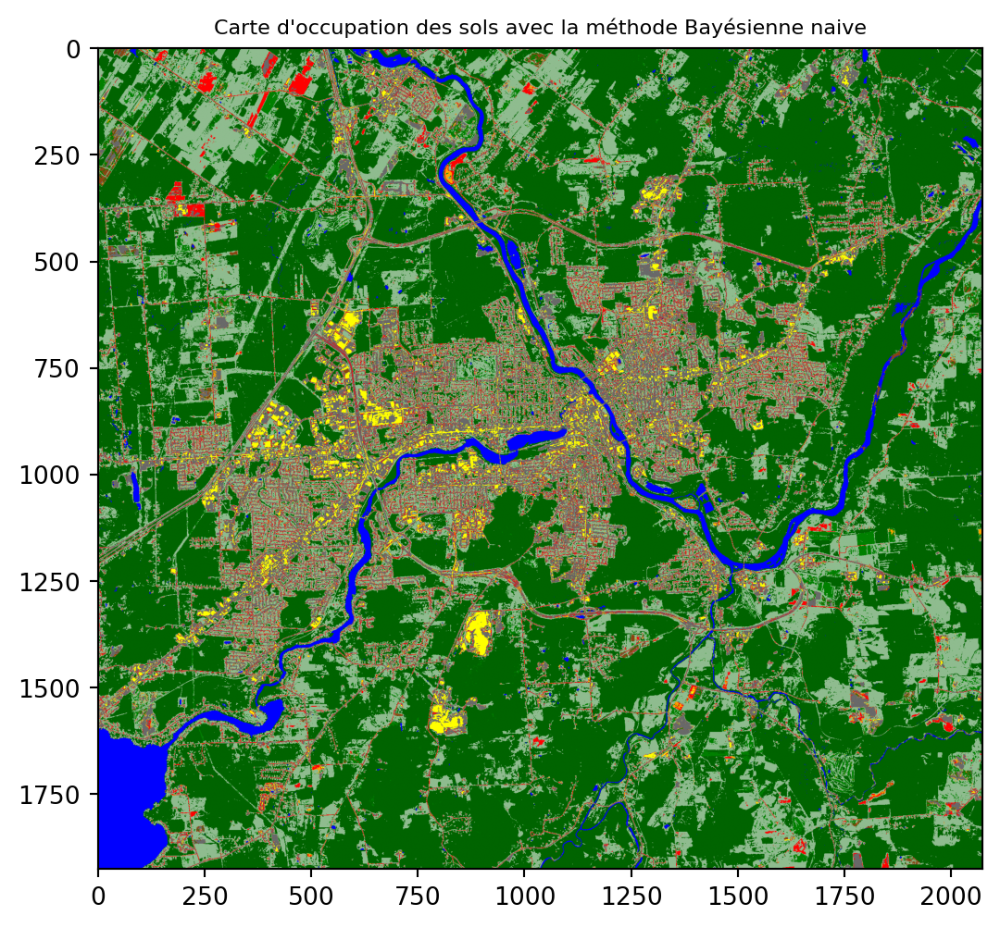

In [44]:
#| echo: false
#| warning: false
data_image= img_rgbnir.to_numpy().transpose(1,2,0).reshape(img_rgbnir.shape[1]*img_rgbnir.shape[2],4)
y_classe= gnb.predict(data_image)
y_classe= y_classe.reshape(img_rgbnir.shape[1],img_rgbnir.shape[2])
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 6))
plt.imshow(y_classe, cmap=cmap_classes2)
ax.set_title("Carte d'occupation des sols avec la méthode Bayésienne naive", fontsize="small")
plt.show()

In [45]:
qda = QuadraticDiscriminantAnalysis(store_covariance=True)
qda.fit(X_train, y_train)
y_pred = qda.predict(X_test)
print("Nombre de points misclassifiés sur %d points : %d"
  % (X_test.shape[0], (y_test != y_pred).sum()))

Nombre de points misclassifiés sur 200 points : 124


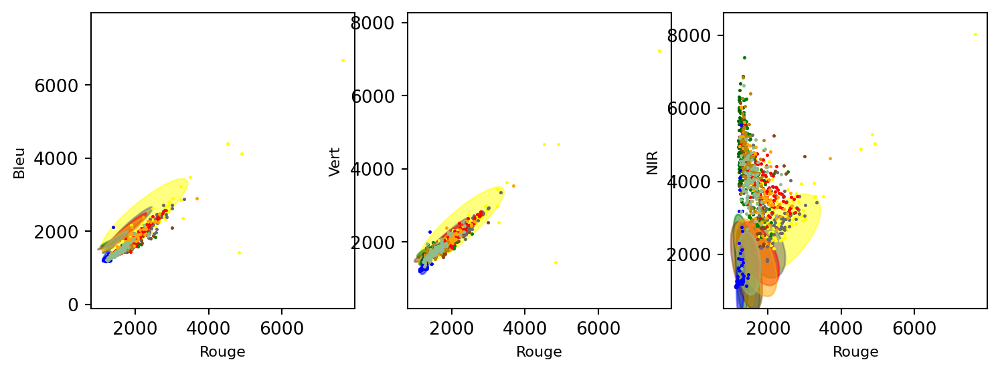

In [46]:
#| echo: false
#| warning: false

import matplotlib as mpl
colors= [couleurs_classes[c] for c in np.unique(y).tolist()]
def make_ellipses(gmm, bands, ax):
    for n, color in enumerate(colors):
        
        covariances = gmm.covariance_[n][np.ix_(bands, bands)]
        
        v, w = np.linalg.eigh(covariances)
        u = w[0] / np.linalg.norm(w[0])
        angle = np.arctan2(u[1], u[0])
        angle = 180 * angle / np.pi  # convert to degrees
        v = 2.0 * np.sqrt(2.0) * np.sqrt(v)
        #print(v)
        ell = mpl.patches.Ellipse(
            gmm.means_[n, :2], v[0], v[1], angle=180 + angle, color=color
        )
        ell.set_clip_box(ax.bbox)
        ell.set_alpha(0.5)
        ax.add_artist(ell)
        ax.set_aspect("equal", "datalim")

plt.figure(figsize=(9, 3))
#plt.subplots_adjust(
#    bottom=0.01, top=0.95, hspace=0.15, wspace=0.05, left=0.01, right=0.99
#)
noms_bandes= ['Bleu','Vert','Rouge','NIR']
for index, b in enumerate([0,1,3]):
  h = plt.subplot(1, 3, index+1)
  bands= [2,b]
  make_ellipses(qda, bands, h)
  for n, color in enumerate(colors):
          data = X[y_new == n,...]
          plt.scatter(
              data[:, bands[0]], data[:, bands[1]], s=0.8, color=color
          )
  h.set_xlabel(noms_bandes[2], fontsize="small")
  h.set_ylabel(noms_bandes[b], fontsize="small")

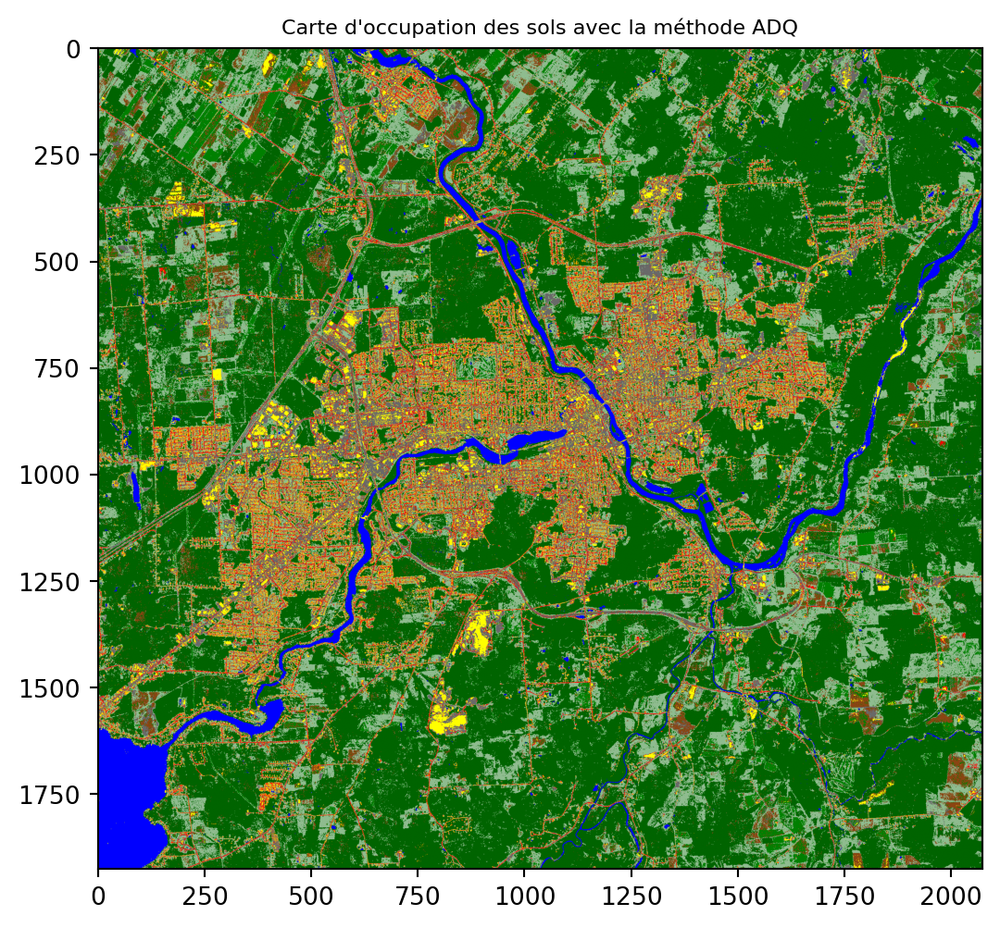

In [47]:
#| echo: false
#| warning: false
data_image= img_rgbnir.to_numpy().transpose(1,2,0).reshape(img_rgbnir.shape[1]*img_rgbnir.shape[2],4)
y_classe= qda.predict(data_image)
y_classe= y_classe.reshape(img_rgbnir.shape[1],img_rgbnir.shape[2])
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 6))
plt.imshow(y_classe, cmap=cmap_classes2)
ax.set_title("Carte d'occupation des sols avec la méthode ADQ", fontsize="small")
plt.show()